### Insurance Claims- Fraud Detection
#### Problem Statement:
#### Business case:
Insurance fraud is a huge problem in the industry. It's difficult to identify fraud claims. Machine Learning is in a unique position to help the Auto Insurance industry with this problem.

In this project, you are provided a dataset which has the details of the insurance policy along with the customer details. It also has the details of the accident on the basis of which the claims have been made. 

In this example, you will be working with some auto insurance data to demonstrate how you can create a predictive model that predicts if an insurance claim is fraudulent or not. 

### Machine Learning Steps:
    1.Define required libraries with which the model will optmised.
    2.Data Cleansing and Wrangling.
    3.Feature Engineering
    4.Data pre-processing
    5.Feature selection
    6.Split the data into training and testing
    7.Model selection
    8.Model validation
    9.Interpret the results

### Define the required libraries

In [176]:
#as of now we will import pandas, numpy library and the remainig will be downloaded at the time of theie requirement
import pandas as pd
import numpy as np

#### loading the data set

In [177]:
data=pd.read_csv('infraud.csv')

In [178]:
#observining into the data
data.head(2)

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN


In [179]:
# loading the data into data frame
# lets the variable be infrd for loan application
infrd=pd.DataFrame(data)

In [180]:
infrd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

### Observations:
    1.there are 40 columns
    2.maximum entries in each field are 10000
    3.no null values in any of the field
    4.there are 2 float dtype fields, 17 int dtype fields, 21 string dtypes in the data set
    5. 40th olumn _c39 is all null value column we can drop it initially 
    6. policy number is a unique number which has not any effect on the target variable so we can drop it also

In [181]:
infrd.isna().sum()

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                    0
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

In [182]:
infrd.policy_annual_premium.nunique()

991

In [183]:
infrd.drop(['_c39','policy_number'],axis=1,inplace=True)

### Exploratory Data Analysis(EDA)

#### Statistical Analysis

In [25]:
a=infrd.describe(include='all')
for i in a.columns:
    print(a[i])

<ipython-input-25-974a9a4d7cd3>:1: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  a=infrd.describe(include='all')


count     1000.000000
unique            NaN
top               NaN
freq              NaN
first             NaN
last              NaN
mean       203.954000
std        115.113174
min          0.000000
25%        115.750000
50%        199.500000
75%        276.250000
max        479.000000
Name: months_as_customer, dtype: float64
count     1000.000000
unique            NaN
top               NaN
freq              NaN
first             NaN
last              NaN
mean        38.948000
std          9.140287
min         19.000000
25%         32.000000
50%         38.000000
75%         44.000000
max         64.000000
Name: age, dtype: float64
count                    1000
unique                    951
top       1992-05-08 00:00:00
freq                        3
first     1990-01-02 00:00:00
last      2015-03-01 00:00:00
mean                      NaN
std                       NaN
min                       NaN
25%                       NaN
50%                       NaN
75%                       NaN
m

### Observations:
    1.months as a customer column has large std compared to mean, there is large difference between the percentiles also.
    2.age column has less std, the difference in the percentiles are less.mean and median are almost equal
    3.peoplpe are carrying the policy from long time ago like from 1992 to till now
    4.policy state is having the oh at the highest
    5.policy calss 250/500 is the highest with 351 lead
    6.policy deductable has large std, mean and media are close but not equal
    7.policy_annual_premium is having the mean and median equal large differecne between the min and 25th percentile
    8.umbrella limit has only 2 limits i.e -1000000 to 10000000
    9.insured zip has mean and median value sclose to each other but not equal, min,25th 50th percentiles are very close each other
    there is difference between 50th to 75th percentile, 75th to max value.
    10.insured_sex column has leading with female
    11.insured_education_level is having 7 categories with JD as leading
    12.insured_occupation is having 14 calsses 
    13 insured_hobbies are of 20 calsses
    14.insured_relationship is of 6 types
    15.incident hour is having the mean and median are equal with less differencence in the percentiles


In [184]:
# we are going to do the further more analysis with visual graphs
# for that we are going to import the seaborn, matplot lib libraries
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')


### univarient analysis

In [65]:
# univarient analysis
sns.set_theme(style='darkgrid',palette='deep',font_scale=2.5, color_codes=True)
c=1
plt.figure(figsize=(20,600))
for i in infrd.columns:
    plt.subplot(40,1,c)
    if infrd[i].dtype==object:
        infrd[i].value_counts().plot.bar()
        plt.title(i)
    else:
        infrd[i].plot.line()
        plt.title(i)
    
    plt.tight_layout(pad=2.0)
    c=c+1
plt.show()

### Observations:
    1.by the time data was collected those are customers from 8 months to 480
    2.people are aged from 18 years to 78 max
    3.policy_bind_date are from 1992 to 2016
    4.policy states are of 3 types in which OH is the most selected one
    5.plicy class 250/500 is the highest
    6.policy annual premium was in range of 1000 to 1500
    7.umbrella limit was in range of 100000 to 100000
    8.female are most insured ones
    9.there are 7 calsses in the education of the insured people
    10.14 calsses in profeion of the insured people
    11.reading is the major count as hobby 
    12.people chosing their child as insured person after him
    13.most of the incidents are recorded in month of feb that to on 02-02-2015
    14.incident type multi vehicle collision is high followed by single vehicle collision
    15.rear collisins are followed with side collisions
    16.minor damages are high as compared to remaining damages
    17.people used contact police after the incident followed by fire
    18.incident state Ny is majorly found 
    19.spring field city is the majore for accidents
    20.incidents are recording in all the hours of the day
    21.number of vehicles involved are minimum 1 to maximum 4
    22.property damaged not decided was high compared to yes
    23.Fraud reports are less compared to truely happended

### Bivarient Analysis

#### we are going to check the all the independent variables relation with the fraud

In [185]:
# lets convert all the string data into numeric by using the encoders
# by using lable encoders
# importing the encoders from the sklearn
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
lb=LabelEncoder()
for i in infrd.columns:
    if infrd[i].dtype==object:
        infrd[i]=lb.fit_transform(infrd[i])

<Figure size 1440x720 with 0 Axes>

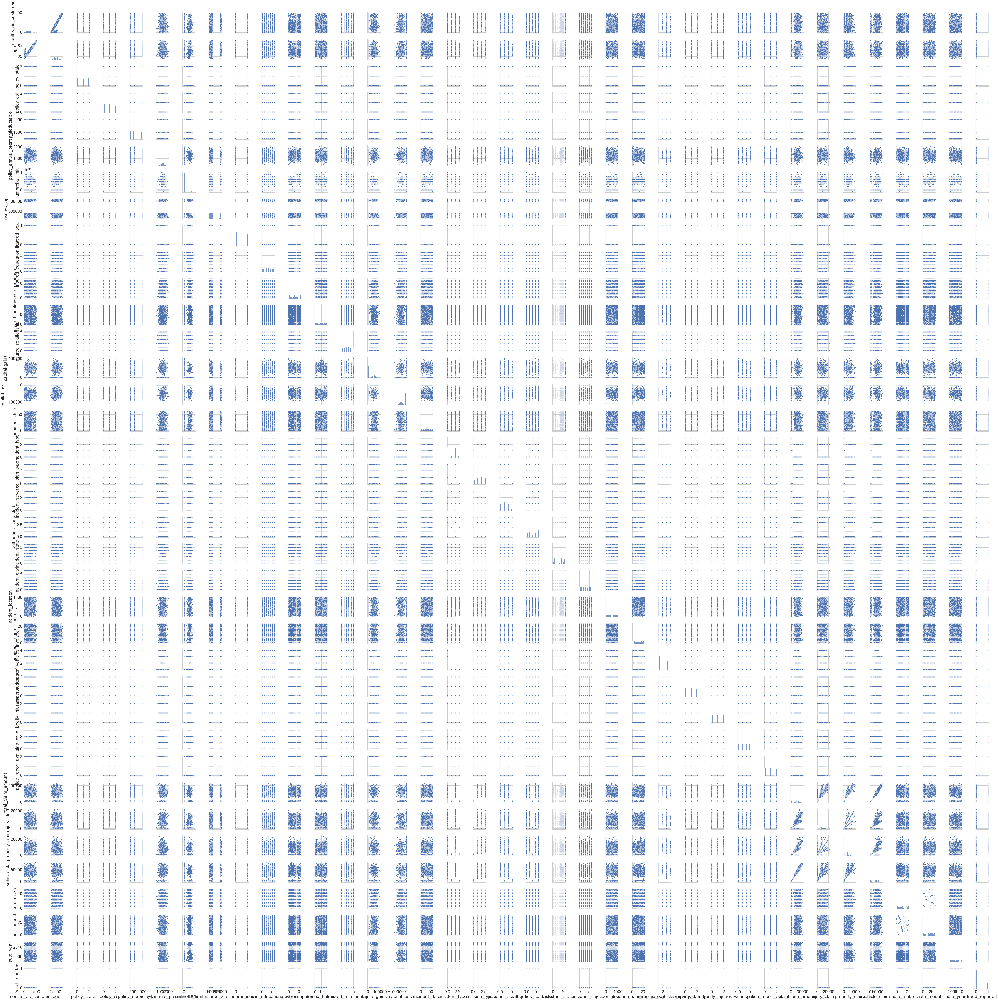

In [99]:
plt.figure(figsize=(20,10))
sns.pairplot(infrd)

### observations:
    it is clear that the fraud is not dependent on any particular case
    it is yes in some cases and no on same case 
    all vehicle models have fraud occured
    all age groups have doing the fraud
    all insurance types it common
    insurance premium types are having the fraud
    

### checking for outliers

months_as_customer             AxesSubplot(0.125,0.864205;0.775x0.015795)
age                            AxesSubplot(0.125,0.845251;0.775x0.015795)
policy_state                   AxesSubplot(0.125,0.826297;0.775x0.015795)
policy_csl                     AxesSubplot(0.125,0.807343;0.775x0.015795)
policy_deductable              AxesSubplot(0.125,0.788389;0.775x0.015795)
policy_annual_premium          AxesSubplot(0.125,0.769435;0.775x0.015795)
umbrella_limit                 AxesSubplot(0.125,0.750481;0.775x0.015795)
insured_zip                    AxesSubplot(0.125,0.731527;0.775x0.015795)
insured_sex                    AxesSubplot(0.125,0.712573;0.775x0.015795)
insured_education_level        AxesSubplot(0.125,0.693619;0.775x0.015795)
insured_occupation             AxesSubplot(0.125,0.674665;0.775x0.015795)
insured_hobbies                AxesSubplot(0.125,0.655711;0.775x0.015795)
insured_relationship           AxesSubplot(0.125,0.636757;0.775x0.015795)
capital-gains                  AxesSub

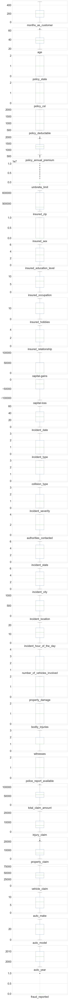

In [102]:
infrd.plot(kind='box',subplots=True,layout=(40,1),figsize=(10,200))

no outliers are present in the numeric data

### checking the skewness

In [104]:
infrd.skew()

months_as_customer             0.362177
age                            0.478988
policy_state                  -0.026177
policy_csl                     0.088928
policy_deductable              0.477887
policy_annual_premium          0.004402
umbrella_limit                 1.806712
insured_zip                    0.816554
insured_sex                    0.148630
insured_education_level       -0.000148
insured_occupation            -0.058881
insured_hobbies               -0.061563
insured_relationship           0.077488
capital-gains                  0.478850
capital-loss                  -0.391472
incident_date                  0.004756
incident_type                  0.101507
collision_type                -0.193345
incident_severity              0.279016
authorities_contacted         -0.121744
incident_state                -0.148865
incident_city                  0.049531
incident_location              0.000000
incident_hour_of_the_day      -0.035584
number_of_vehicles_involved    0.502664


skewness present in umbrella limit we are going to drop that column

In [186]:
# auto year and auto model does not have much impact to output we are gong to drop them also
infrd.drop(['umbrella_limit','auto_make','auto_model','auto_year'],axis=1,inplace=True)

### checking the correlation

since the output is classification type there is no need for checking of correlation of the data

### Scaling

In [187]:
#importing scaling methods
from sklearn.preprocessing import MinMaxScaler, StandardScaler

### Spliting the data

In [188]:
x=infrd.iloc[:,0:-1]
y=infrd.iloc[:,-1]

In [191]:
scale=MinMaxScaler()
for i in x.columns:
    d=np.array(x[i])
    scale.fit(d.reshape(-1,1))
    x[i]=scale.transform(d.reshape(-1,1))
    

In [192]:
x.head(2)

,months_as_customer,age,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,insured_zip,insured_sex,insured_education_level,...,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim
0,0.684760,0.644444,0.560000,1.0,0.5,0.333333,0.603112,0.188769,1.0,0.666667,...,0.217391,0.0,1.0,0.5,0.666667,1.0,0.622801,0.303497,0.550063,0.654296
1,0.475992,0.511111,0.864211,0.5,0.5,1.000000,0.473214,0.199478,1.0,0.666667,...,0.347826,0.0,0.0,0.0,0.000000,0.0,0.043285,0.036364,0.032953,0.043276


### balancing of the data set

In [195]:
x.shape,y.shape,y.value_counts()# before balancing

((1000, 33),
 (1000,),
 0    753
 1    247
 Name: fraud_reported, dtype: int64)

In [196]:
# importing the required library
from imblearn.over_sampling import SMOTE
x, y = SMOTE().fit_resample(x, y)

In [197]:
x.shape,y.shape,y.value_counts()# after balancing

((1506, 33),
 (1506,),
 0    753
 1    753
 Name: fraud_reported, dtype: int64)

### hyper perameter tuning

In [198]:
# importing the required libraries
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_curve, roc_auc_score
from sklearn.model_selection import cross_val_score
import warnings
warnings.filterwarnings('ignore')
lr,rf,ac,dt=LogisticRegression(),RandomForestClassifier(),AdaBoostClassifier(),DecisionTreeClassifier()

In [199]:
#creating perameters
model_par={
           lr:{'model':lr,'param':{'penalty':['l1', 'l2', 'elasticnet', 'none'],'solver':['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga']}},
    rf:{'model':rf,'param':{'n_estimators':[100,125,150,200],'criterion':["gini", "entropy"],'min_samples_split':[2,2.5,3,3.5]}},
    ac:{'model':ac,'param':{'n_estimators':[50,100,150,200],'learning_rate':[1,2,3,4],'algorithm':['SAMME', 'SAMME.R']}},
    dt:{'model':dt,'param':{'criterion':["gini", "entropy"],'splitter':['best','random'],'min_samples_leaf':[1,2,3]}}
           }
scores=[]
for model_name, mp in model_par.items():
    model_selection=GridSearchCV(estimator=mp['model'],param_grid=mp['param'],cv=5,return_train_score=False)
    model_selection.fit(x,y)
    scores.append({'model':model_name,'best_score':model_selection.best_score_,'best_params':model_selection.best_params_})
scores

[{'model': LogisticRegression(),
  'best_score': 0.7377329431695673,
  'best_params': {'penalty': 'l1', 'solver': 'liblinear'}},
 {'model': RandomForestClassifier(),
  'best_score': 0.8831972893885723,
  'best_params': {'criterion': 'entropy',
   'min_samples_split': 2,
   'n_estimators': 200}},
 {'model': AdaBoostClassifier(),
  'best_score': 0.8520318584849619,
  'best_params': {'algorithm': 'SAMME.R',
   'learning_rate': 1,
   'n_estimators': 50}},
 {'model': DecisionTreeClassifier(),
  'best_score': 0.8473278915755429,
  'best_params': {'criterion': 'entropy',
   'min_samples_leaf': 1,
   'splitter': 'best'}}]

So we are going to select the RandomForestClassifier as it was highest score from gridsearch cv

In [200]:
rf=RandomForestClassifier(criterion='entropy',min_samples_split=2)

the model performs best at random state 13
test accuracy_score of 0.9557522123893806
test roc_auc_score of 0.9941660947151681
train accuracy_score of 0.9629981024667932
train roc_auc_score of 0.9957392093586123
cross validation score 85.52456839309428
confusion_matrix of 
 [[226   9]
 [ 11 206]]
classification_report of 
               precision    recall  f1-score   support

           0       0.95      0.96      0.96       235
           1       0.96      0.95      0.95       217

    accuracy                           0.96       452
   macro avg       0.96      0.96      0.96       452
weighted avg       0.96      0.96      0.96       452



Text(0.5, 1.0, 'ROC Curve')

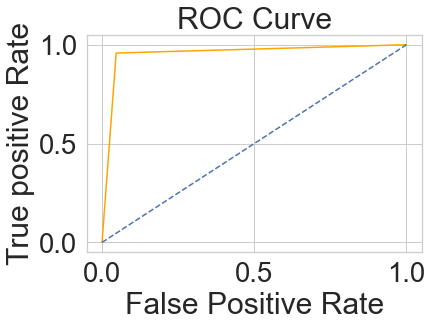

In [201]:
tep,trp,I=[],[],[]
for i in range(1,50):
    xtrain,xtest,ytrain,ytest=train_test_split(x,y,test_size=0.3, random_state=i)
    rf.fit(xtrain,ytrain)
    test_pre=rf.predict(xtest)
    train_pre=rf.predict(xtrain)
    Tep=accuracy_score(ytest,test_pre)
    Trp=accuracy_score(ytrain,train_pre)
    Cv=cross_val_score(rf,x,y,cv=3).mean()*100
    tep.append(Tep)
    trp.append(Trp)
    I.append(i)
    
values=pd.DataFrame({'Test_acc':tep,'Train_acc':trp,'random_state':I})
values.sort_values(by='Test_acc',inplace=True,ignore_index=True)
print('the model performs best at random state',values.iloc[0,2])
xtrain,xtest,ytrain,ytest=train_test_split(x,y,test_size=0.3, random_state=values.iloc[0,2])
test_pre=rf.predict(xtest)
train_pre=rf.predict(xtrain)
test_pre_prob=rf.predict_proba(xtest)
train_pre_prob=rf.predict_proba(xtrain)
print("test accuracy_score of",accuracy_score(ytest,test_pre))
print("test roc_auc_score of", roc_auc_score(ytest,test_pre_prob[:,1]))
print("train accuracy_score of",accuracy_score(ytrain,train_pre))
print("train roc_auc_score of", roc_auc_score(ytrain,train_pre_prob[:,1]))
print("cross validation score", cross_val_score(rf,x,y,cv=3).mean()*100)
print("confusion_matrix of",'\n', confusion_matrix(ytest,test_pre))
print("classification_report of",'\n',classification_report(ytest,test_pre))
fpr,tpr,tr=roc_curve(test_pre, ytest)
plt.plot(fpr,tpr,color='orange')
plt.plot([0,1],[0,1],linestyle='--')
plt.xlabel("False Positive Rate")
plt.ylabel("True positive Rate")
plt.title("ROC Curve")